Download from freesound.org the sound assigned to you (include before the name given http://www.freesound.org/people/) and read all the information describing it. If the sound is too long, select a representative fragment of less than five seconds in length (2 seconds would be ideal). If the sound does not have the recommended format change it, using any sound editor. You can also perform some pre-processing to create a more adequate sound. Save the edited sound in your working directory.


Create the python notebook to be used for the whole exam and perform the following tasks. Read the downloaded/edited sound and display it. Compute its STFT and show the magnitude spectrogram. Explain the edits you did on the original sound given and explain why you choose this sound fragment. Describe the sound by using its temporal and spectral representation, focusing on what information should be useful for processing the sound with spectral models, thus for deciding the spectral analysis parameters. Show any partial representation, temporal or spectral, of the sound to support your description.

The sound chosen for me is; https://freesound.org/people/xserra/sounds/126404/ 

Sounde description;
Fragment of a concert by Parag Chordia playing the sarod. This is the second part of the Alap section, introduction, of a piece. The sarod is playing alone with only the accompaniment of the shruti box (in fact a synthesizer on an iPhone). Recorded on a concert at the UPF in Barcelona on June 22nd 2011.

By listening to the 2 channels of the original (stereo) audio file, I can tell that 1 channel presents higher amount of energy in higher frequencies (it sounds brighter), while the other presents more energy in the lower frequencies (it sounds darker). I choose to select the "brighter" channel, without performing a mono sum (because with a mono sum we would lose the "phase" relationship between the 2 channels - in fact, looking at the waveforms there seems to be a minimum amount of "delay" between the 2 channels).

Converting the file from stereo to mono is the only editing I need to perform in order to prepare the sound.
The sound is now mono and (it was already) 16 bit, 44.1 kHz sampling rate and .wav format.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import get_window
import sys, os
sys.path.append('../software/models/')
import utilFunctions as UF
import stft as STFT
import IPython.display as ipd
import math

Sound duration in seconds;
1.8880272108843537


"\nplt.subplot(2,1,2)\nnumFrames = int(mX[:,0].size)\nfrmTime = H*np.arange(numFrames)/float(fs)\nbinFreq = fs*np.arange(N*maxplotfreq_pitch/fs)/N\nplt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq_pitch/fs+1)]))\nplt.xlabel('time (sec)')\nplt.ylabel('frequency (Hz)')\nplt.title('Magnitude spectrogram until 5 kHz for perceived pitch')\n"

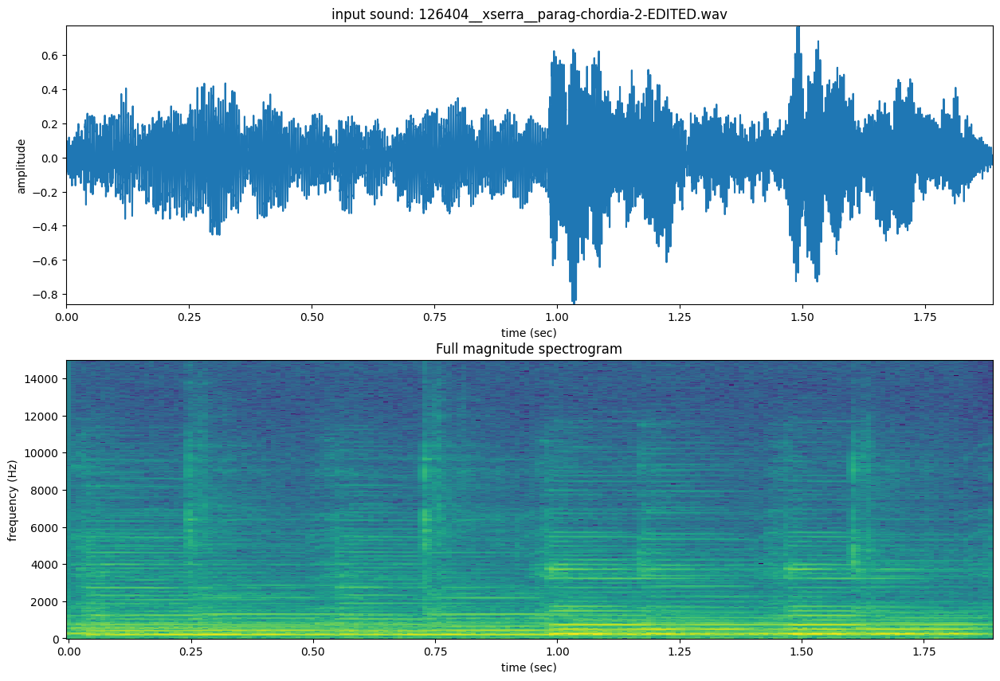

In [2]:
input_file = '126404__xserra__parag-chordia-2-EDITED.wav'

### set parameters
window = 'blackmanharris'
M = 1765
N = 2048
H = 440

    
fs, x = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
mX, pX = STFT.stftAnal(x, w, N, H)

x_dur = len(x) / fs
print("Sound duration in seconds;")
print(x_dur)

ipd.display(ipd.Audio(data=x, rate=fs))

plt.figure(figsize=(15, 10))
maxplotfreq_full = 15000.0 # plot up to 15 kHZ
maxplotfreq_pitch = 5000.0 # plot up to 5 kHZ, as pitch is perceived by humans up until 5 kHz

# plot input sound
plt.subplot(2,1,1)
plt.plot(np.arange(x.size)/float(fs), x)
plt.axis([0, x.size/float(fs), min(x), max(x)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('input sound: 126404__xserra__parag-chordia-2-EDITED.wav')

# plot full magnitude spectrogram
plt.subplot(2,1,2)
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq_full/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq_full/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('Full magnitude spectrogram')
plt.plot()

# plot magnitude spectrogram up until 5 kHz
"""
plt.subplot(2,1,2)
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq_pitch/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq_pitch/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('Magnitude spectrogram until 5 kHz for perceived pitch')
"""

Explain the edits you did on the original sound given and explain why you choose this sound fragment. Describe the sound by using its temporal and spectral representation, focusing on what information should be useful for processing the sound with spectral models, thus for deciding the spectral analysis parameters. Show any partial representation, temporal or spectral, of the sound to support your description.

I chose a 1.88 seconds fragment with clear pitches (but not quite, at least not entirely within the 12-TET "scale", as it is Hindustani music), and I edited the sound so that the start and end coincide as much as possible with onsets, so that, in a way, the audio fragment corresponds to a musical fragment. In terms of musical content, it contains patterns of couple of close notes, repeated and "transposed". I applied a short "fade out" (volume envelope) at the end of the fragment, in order to cancel the attack of the next note, absent in the edited sound, so that its end is smoother and does not clip. The start of the edited fragment has also been taken from a 0 crossing spot.
The edited sound is extracted from the original Freesound sound at approximately t = 12 s.

We can clearly hear some noisy transients at t = 0.25 s, 0.70 s, and 1.6 s. Their timing correspond to the 2nd, 4th, and 8th note played, and the sound is the typical sound of string noise, like squeaks. In the case of sarod, for example comparing against the guitar, this noisy sound has a clearer attack and it's more percussive because the fingerboard is made off metal, and the player uses the tip of the nails to press the strings (https://www.youtube.com/watch?v=X8UV1DjV8e8&ab_channel=PhilharmoniaOrchestra).

The sound file is polyphonic and harmonic.
By ear and with the help of my favourite musical instrument, I "transcribed" the musical notes performed in the sound;
the notes are -excluding repetitions- G#3, A3, C, C#3. The pitch of C3 abnd C#3 is not really in tune, since quarter tones are used instead of the 12-TET system.
A rough -with no calculation of M- spectrogram, in fact, shows energy around 207 hZ (G#3), 220 hZ (A3), 260/270 hZ (frequencies around C3/C#3 pitches) (https://upload.wikimedia.org/wikipedia/commons/a/ad/Piano_key_frequencies.png).

Window type;
Blackman-harris is the window with lower side lobes. I tried with Blackman (higher side lobes but narrower main lobe comparing to Blackman-harris) but the results are not better.

Window size (M) calculation;
M can then be calculated keeping G#3 (rounding 207 hZ to 200 hZ) as lowest fundamental frequency.
The formula is; M >= window main lobe width * (sampling rate / F0) ->  M >= Bs * (fs / F0)
8 * (44100 / 200) = 1764 -> 1765 for 0 phase windowing.

FFT size is the smallest powet of 2 bigger than M (2048).

The hop size is roughly M / 4 (440).

The shown spectrogram makes clear that the harmonics go up to almost 12 kHz (even though the most prominent ones are up to 6 kHz), and the transient noises I commented above go higher, up and above 14 kHz.
Even though they are not perceptually much relevant, you can see "glissandos" in the partials whenever a 2-notes melodic upward pattern starts over (t = 0.5 s, 1. s, 1.4 s).
This also confirms that most likely we obtained a good time resolution, and hence a good frequency-time resolution compromise in computing the STFT.

In [398]:
"""
I tried to choose a segment which has "already" a structure and a pattern hierarchy, which I described above.
This will help for part 2.
"""

'\nI tried to choose a segment which has "already" a structure and a pattern hierarchy, which I described above.\nThis will help for part 2.\n'

Part 2 (option b): Theme and variations
The aim of this exercise is to extend what you did in Assignment 8 using the assigned sound and having no limitations on the analysis models to use, the transformations to apply, and the number of transformed sounds to combine. The end result should be a short “music piece” (maximum 30 seconds long) combining various transformations using the tools explained in class. Everything has to be done from the python notebook and there should be no need to attach any sound (unless clearly justified, for example for doing a morph).

1. Choose a model that would allow to perform an adequate analysis of the assigned sound, thinking on the transformation application. Perform the analysis and check that the synthesis without transformations is good. Explain the choices made and the result obtained.

In [3]:
"""
Since I realized that, after transformations, the output signals are slightly shorter (fewer samples) than expected,
this function 0 pads an array until a given size is reached.
It will be used to make the patterns matching the length (duration) of the one of the starting edited sound.
"""
def zeroPadArray_UntilSizeIsReached(x, y_Size):
    """
    0 pad an array until a given size is reached
    x: array to 0 pad
    y_Size: size x has to reach
    """

    number_of_missing_0s = y_Size - len(x)
    
    y = np.pad(x, (0, number_of_missing_0s), 'constant')
    
    return y

In [4]:
import sineModel as SM

In [5]:
# Sinusoidal model

input_file = '126404__xserra__parag-chordia-2-EDITED.wav'

window = 'blackmanharris'
M = 1765 # see previous part
N = 2048 # see previous part
# H = 440
t = -70                                                 
minSineDur = 0.05                     
maxnSines = 50  # 10000 (hZ up to which harmonics are present) / 200 (F0)
freqDevOffset = 8
freqDevSlope = 0.05

Ns = 512                                      # size of fft used in synthesis
H = 128                                       # hop size (has to be 1/4 of Ns)
    
fs, x = UF.wavread(input_file)                # read input sound
w = get_window(window, M)                     # compute analysis window

# analyze the sound with the sinusoidal model
tfreq, tmag, tphase = SM.sineModelAnal(x, fs, w, N, H, t, maxnSines, minSineDur, freqDevOffset, freqDevSlope)

# synthesize the output sound from the sinusoidal representation
y_sin_mod = SM.sineModelSynth(tfreq, tmag, tphase, Ns, H, fs)
y_sin_mod = zeroPadArray_UntilSizeIsReached(y_sin_mod, len(x))

print("Original sound")
ipd.display(ipd.Audio(data=x, rate=fs))

print("Sinusoidal model")
ipd.display(ipd.Audio(data=y_sin_mod, rate=fs))

Original sound


Sinusoidal model


In [6]:
import hpsModel as HPS

In [7]:
# Harmonic + Stochastic model

input_file = '126404__xserra__parag-chordia-2-EDITED.wav'

window = 'blackmanharris'
M = 1765 # see previous part
N = 2048 # see previous part
# H = 440
t = -70
minSineDur = 0.05
nH = 50 # 10000 (hZ up to which harmonics are present) / 200 (F0)
minf0 = 200 # G#3
maxf0 = 300 # D3
f0et = 8
harmDevSlope = 0.05
stocf = 1

Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
hfreq, hmag, hphase, stocEnv = HPS.hpsModelAnal(x, fs, w, N, H, t, nH, minf0, maxf0, f0et, harmDevSlope, minSineDur, Ns, stocf)
y_harm_mod, yh, y_stoc_mod = HPS.hpsModelSynth(hfreq, hmag, hphase, stocEnv, Ns, H, fs)

print("Original sound")
ipd.display(ipd.Audio(data=x, rate=fs))

print("Harmonic model")
ipd.display(ipd.Audio(data=y_harm_mod, rate=fs))

print("Stochastic model")
ipd.display(ipd.Audio(data=y_stoc_mod, rate=fs))

Original sound


Harmonic model


Stochastic model


I experimented with both the sinusoidal and the harmonic + stochastic model; since the original sound is polyphonic (sarod + shruti box), neither of the models performs very well, but I think the sinusoidal model isolates the sarod better, even if it yields a less "natural" sound (that is, much less noisy than the original sound, and more "synthetic").
I will use the stochastic model to get the part of the sound which is not the sarod.

My transformations will be based on;
---- musical notes pattern manipulation, pitch and time stretching based on the sinusoidal model.
The original edited sound, of almost 2 seconds length, is taken as reference pattern, and its duration is set to be 1 4/4 measure (bar) of the music. All patterns will have this length, or half of it; I will first create the patterns with programmatic audio "editing" (meaning that I will cut the reference pattern into smaller parts) and then perform time scaling and/or frequency scaling on this little "child" patterns.
Finally, during the mix I will concatenate the patterns both vertically (polyphonically) and horizontally (one after the other).
---- drums pattern creation using percussive sounds derived from samples taken from the stochastic model.
The string noise "squeaks" are used as starting point to construct percussive sounds.
The squeak sound is used as it is for a snare-like sound.
Then, it is frequency-scaled down (0.3) to obtain a hihat-like sound.
Then, it is frequency-scaled down (0.1) and time scaled (1.5 times longer) to obtain a kick-like sound.
The single sounds are concatenated one after the other obtaining 1 bar long single-instruments tracks with a pre-determined drum pattern in mind (see below), obtaining separated "stems" for kick, hihat and snare.
Finally, the drums master track is obtained by mixing the stems and stacking them "vertically" and horizontally in a musically meaningfull (to me) way.

Both drums and "synthetic sarod" parts will "musically" build and destroy an "orchestral tutti" towards the centre of the composition, starting and eding in a more rarefacted musical atmosphere (there is a central climax in both number of patterns -both drums and sarod- played and loudness intensity).

The piece will be 16 times longer than the starting edited input sound, so that the final duration of the music track will be around 30 seconds (as requested), and the piece will have a hierarchical, structural and temporal coherence.

2. Perform a variety of single transformations (one single analysis/transformation/ synthesis sequence for each one), using any analysis model (not just the one used in the previous part and without the need to focus on quality of imitation), and covering a wide variety of effects (natural an unnatural). Explain each transformation, both technically and musically.

In [8]:
"""
Create "musical variations" of the (sinusoidal model of the) original edited sound, which have the same duration of it, or half of it.
Target duration = 1.8880272108843537 s = 1 bar

The single patterns do not make a lot of musical sense on their own, but hopefully they do at the end (master track).
In a 30 seconds piece, I can hardly think of single transformations that can make a lot of sense on their own,
unless they last the entire duration of the piece -perhaps involving morphings-, and then they are mixed (summed) together.
I, instead, had a groove-musical idea first, then I chose to create many little musical chunks,
and then I concentrated on how to compose them together to fulfill the original idea.

Rather than creating a large number of different types of transformations, I basically focus only on audio segmentation
(for which the initial choice of 2 secs segment was very important to start with),
time scaling and frequency scaling; the point I focused on is the overall intention, sound design and musical compositional approach.
Specifically, I like the creation and manipulation of rhythmic and melodic patterns, so this is basically what I have done
and the transformations are a tool, not the objective (even though I know this is an exercise).

I don't want to imitate any style, but probably the music resembles "electronic music".
"""

sys.path.append('../software/transformations/')
import sineTransformations as ST

"""
Here I create a function that performs time scaling and takes a raw audio time domain waveform as input
I do this since I will be needing this operation many times, and I don't have to time scale an entire
audio file, but only a part of it
It abstracts and wraps the SM.sineModelAnal(), SM.sineModelSynth() and ST.sineTimeScaling()
functions to work with an arbitrary supplied audio signal in the time domain rather than from a STFT
"""
def performTimeScaling_FromAudioWaveform(x, fs, timeScaling):
    """
    Time scaling of raw audio waveform
    x: audio samples in time domain
    fs: sample rate
    timeScaling: scaling factors, in time-value pairs
    """

    window = 'blackmanharris'
    M = 1765 # see previous part
    N = 2048 # see previous part
    t = -70                                                 
    minSineDur = 0.05                     
    maxnSines = 50  # 10000 (hZ up to which harmonics are present) / 200 (F0)
    freqDevOffset = 8
    freqDevSlope = 0.05

    Ns = 512                                      # size of fft used in synthesis
    H = 128                                       # hop size (has to be 1/4 of Ns)
    
    w = get_window(window, M)                     # compute analysis window

    # analyze the sound with the sinusoidal model
    tfreq, tmag, tphase = SM.sineModelAnal(x, fs, w, N, H, t, maxnSines, minSineDur, freqDevOffset, freqDevSlope)

    # sinusoidal time scaling
    tfreq_scaled, tmag_scaled = ST.sineTimeScaling(tfreq, tmag, timeScaling)
    
    # synthesize the output sound from the sinusoidal representation
    y = SM.sineModelSynth(tfreq_scaled, tmag_scaled, np.array([]), Ns, H, fs)
    
    return y

"""
Here I create a function that performs frequency scaling and takes a raw audio time domain waveform as input
I do this since I will be needing this operation many times, and I don't have to frequency scale an entire
audio file, but only a part of it
It abstracts and wraps the SM.sineModelAnal(), SM.sineModelSynth() and ST.sineFreqScaling()
functions to work with an arbitrary supplied audio signal in the time domain rather than from a STFT
"""
def performFreqScaling_FromAudioWaveform(x, fs, freqScaling):
    """
    Time scaling of raw audio waveform
    x: audio samples in time domain
    fs: sample rate
    freqScaling: f scaling factors
    """

    window = 'blackmanharris'
    M = 1765 # see previous part
    N = 2048 # see previous part
    t = -70                                                 
    minSineDur = 0.05                     
    maxnSines = 50  # 10000 (hZ up to which harmonics are present) / 200 (F0)
    freqDevOffset = 8
    freqDevSlope = 0.05

    Ns = 512                                      # size of fft used in synthesis
    H = 128                                       # hop size (has to be 1/4 of Ns)
    
    w = get_window(window, M)                     # compute analysis window

    # analyze the sound with the sinusoidal model
    tfreq, tmag, tphase = SM.sineModelAnal(x, fs, w, N, H, t, maxnSines, minSineDur, freqDevOffset, freqDevSlope)

    tfreq = ST.sineFreqScaling(tfreq, freqScaling)
        
    # synthesize the output sound from the sinusoidal representation
    y = SM.sineModelSynth(tfreq, tmag, tphase, Ns, H, fs)
    
    return y

In [9]:
"""
Create Pattern A (first note, time scaled for the entire duration of the edited input sound file)
The first note lasts until t = 0.261 s
"""
note_1_end_time = 0.261 
# "Cut" the original edited sound, by calculating the start and end samples of the first note
note_1_start_sample = 0
note_1_end_sample = int(fs * note_1_end_time)
timeScalingArray = np.array([0., 0., note_1_end_time, x_dur])
pattern_A = performTimeScaling_FromAudioWaveform(x[0:note_1_end_sample], fs, timeScalingArray)
pattern_A = zeroPadArray_UntilSizeIsReached(pattern_A, len(x))

print("Pattern A")
ipd.display(ipd.Audio(data=pattern_A, rate=fs))
print("Pattern A duration;")
print(len(pattern_A) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern A


Pattern A duration;
1.8880272108843537
Edited input file duration;
1.8880272108843537


In [10]:
"""
Create Pattern A_transpose_7 (pattern A transposed a fifth above)
"""
freqScaling = np.power(2, 7/12)
freqScalingArray = np.array([0, freqScaling])
pattern_A_trans_7 = performFreqScaling_FromAudioWaveform(pattern_A, fs, freqScalingArray)
pattern_A_trans_7 = zeroPadArray_UntilSizeIsReached(pattern_A_trans_7, len(x))

print("Pattern A trans 7")
ipd.display(ipd.Audio(data=pattern_A_trans_7, rate=fs))
print("Pattern A trans 7 duration;")
print(len(pattern_A_trans_7) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern A trans 7


/Users/matthew/Desktop/UPF/Courses/Audio signal processing for music applications (Xavier Serra)/sms-tools/notebooks/../software/transformations/sineTransformations.py:43: RuntimeWarning: invalid value encountered in divide
  freqScalingEnv = np.interp(np.arange(L), L*freqScaling[::2]/freqScaling[-2], freqScaling[1::2])


Pattern A trans 7 duration;
1.8880272108843537
Edited input file duration;
1.8880272108843537


In [11]:
"""
Create Pattern B (first two notes, time scaled for the entire duration of the edited input sound file)
The fourth note ends at t = 0.261 s
"""
note_4_end_time = 0.979
note_1_start_sample = 0
note_4_end_sample = int(fs * note_4_end_time)
timeScalingArray = np.array([0., 0., note_4_end_time, x_dur])
pattern_B = performTimeScaling_FromAudioWaveform(x[note_1_start_sample : note_4_end_sample], fs, timeScalingArray)
pattern_B = zeroPadArray_UntilSizeIsReached(pattern_B, len(x))

print("Pattern B")
ipd.display(ipd.Audio(data=pattern_B, rate=fs))
print("Pattern B duration;")
print(len(pattern_B) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern B


Pattern B duration;
1.8880272108843537
Edited input file duration;
1.8880272108843537


In [12]:
"""
Create Pattern C (Pattern B double speed)
"""
pattern_B_dur = len(pattern_B) / fs
timeScalingArray = np.array([0., 0., pattern_B_dur, pattern_B_dur/ 2])
pattern_C = performTimeScaling_FromAudioWaveform(pattern_B, fs, timeScalingArray)
pattern_C = zeroPadArray_UntilSizeIsReached(pattern_C, math.floor(len(pattern_B) / 2))

print("Pattern C")
ipd.display(ipd.Audio(data=pattern_C, rate=fs))
print("Pattern C duration;")
print(len(pattern_C) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern C


Pattern C duration;
0.9440136054421768
Edited input file duration;
1.8880272108843537


In [13]:
"""
Create Pattern C transpose 12 (Pattern C one octave above)
"""
pattern_C_dur = len(pattern_C) / fs
freqScaling = np.power(2, 12/12)
freqScalingArray = np.array([0, freqScaling])
pattern_C_trans_12 = performFreqScaling_FromAudioWaveform(pattern_C, fs, freqScalingArray)
pattern_C_trans_12 = zeroPadArray_UntilSizeIsReached(pattern_C_trans_12, len(pattern_C))

print("Pattern C trans 12")
ipd.display(ipd.Audio(data=pattern_C_trans_12, rate=fs))
print("Pattern C trans 12 duration;")
print(len(pattern_C_trans_12) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern C trans 12


Pattern C trans 12 duration;
0.9440136054421768
Edited input file duration;
1.8880272108843537


In [14]:
"""
Create Pattern C transpose 24 (Pattern C 2 octaves above)
"""
pattern_C_dur = len(pattern_C) / fs
freqScaling = np.power(2, 2)
freqScalingArray = np.array([0, freqScaling])
pattern_C_trans_24 = performFreqScaling_FromAudioWaveform(pattern_C, fs, freqScalingArray)
pattern_C_trans_24 = zeroPadArray_UntilSizeIsReached(pattern_C_trans_24, len(pattern_C))

print("Pattern C trans 24")
ipd.display(ipd.Audio(data=pattern_C_trans_24, rate=fs))
print("Pattern C trans 24 duration;")
print(len(pattern_C_trans_24) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern C trans 24


Pattern C trans 24 duration;
0.9440136054421768
Edited input file duration;
1.8880272108843537


In [15]:
"""
Create Pattern D (first two notes identical to the original sound,
third note is time scaled for the entire duration of the rest of the sound)
The third note begins at t = 0.549 s
The third note ends at t = 0.661 s

"""
note_3_start_time = 0.549
note_3_end_time = 0.661
note_3_start_sample = int(fs * note_3_start_time)
note_3_end_sample = int(fs * note_3_end_time)

timeScalingArray = np.array([0., 0., note_3_start_time, note_3_start_time, note_3_end_time, x_dur])
pattern_D = performTimeScaling_FromAudioWaveform(x[0 : note_3_end_sample], fs, timeScalingArray)
pattern_D = zeroPadArray_UntilSizeIsReached(pattern_D, len(x))

print("Pattern D")
ipd.display(ipd.Audio(data=pattern_D, rate=fs))
print("Pattern D duration;")
print(len(pattern_D) / fs)
print("Edited input file duration;")
print(len(x) / fs)

Pattern D


Pattern D duration;
1.8880272108843537
Edited input file duration;
1.8880272108843537


In [16]:
"""
Use the stochastic model in correspondence of the first string noise transient in order to get a percussive sound,
which will then be used as "snare" and, downpitched and time scaled, as "kick" and "hihat".

First string noise transient sound starts at t = 0.226
First string noise transient sound ends at   t = 0.285
"""

snare_sound_first_sample_index = int(fs * 0.226)
snare_sound_last_sample_index = int(fs * 0.285)
snare_sound = y_stoc_mod[snare_sound_first_sample_index : snare_sound_last_sample_index]
snare_sound_dur = len(snare_sound) / fs

freqScalingArray = np.array([0, 0.3])
hihat_sound = performFreqScaling_FromAudioWaveform(snare_sound, fs, freqScalingArray)

timeScalingArray = np.array([0., 0., snare_sound_dur, snare_sound_dur * 1.5])
kick_sound = performTimeScaling_FromAudioWaveform(snare_sound, fs, timeScalingArray)
freqScalingArray = np.array([0, 0.1])
kick_sound = performFreqScaling_FromAudioWaveform(kick_sound, fs, freqScalingArray)

print("Snare-like sound")
ipd.display(ipd.Audio(data=snare_sound, rate=fs))
print("Hihat-like sound")
ipd.display(ipd.Audio(data=hihat_sound, rate=fs))
print("Kick-like sound")
ipd.display(ipd.Audio(data=kick_sound, rate=fs))

Snare-like sound


Hihat-like sound


Kick-like sound


3. Create your final sound mix by post-processing and mixing the transformations obtained in the previous section (all done in python). Explain your intention, the process done, and the result obtained.

In [17]:
"""
CREATE A DRUMS TRACK, WITH THIS "MUSICAL SCORE" IN MIND
(This is the "full drums ensemble"; during the final arrangement I will first put some bars of
kick only, then slowly add other instruments)

1.      2.      3.      4.        PULSES
- - - - - - - - - - - - - - - -   16th divisions

-   -   -   -   -   -   -   -     HI-HAT (plays the eights divisions)
        |               |         SNARE (plays on pulse 2 and 4 of each bar)
X             X     X             KICK (plays at the beginning of the bar, and then performs other 2 syncopated-like kicks around pulse 3)

I already sinthesized single drums sounds, so now I just have to place and repeat them along the time axis,
taking the 16th divisions as "smallest time resolution". The time events are fully quantized, no "humanization"
is envolved.

Absolute time locations are converted into number of samples, and those are used as indeces for accessing array of time waveforms.

Here, only single drums instruments "bars" are composed, that is, only 1 instrument per sound and only 1 musical bar (4/4, see above) per sound.
To see the final master track for the drums, see next section, when they are also mixed.
"""

first_snare_location_t = x_dur * 0.25
first_snare_location_s = int(fs * first_snare_location_t)
second_snare_location_t = x_dur * 0.75
second_snare_location_s = int(fs * second_snare_location_t)

# create empty array for snare track
snare_track = np.zeros(len(x))
# fill with first snare
snare_track[first_snare_location_s :first_snare_location_s + len(snare_sound)] = snare_sound[:]
# fill with second snare
snare_track[second_snare_location_s : second_snare_location_s + len(snare_sound)] = snare_sound[:]


first_kick_location_t = 0
first_kick_location_s = 0
second_kick_location_t = (x_dur / 16) * 7
second_kick_location_s = int(fs * second_kick_location_t)
third_kick_location_t = (x_dur / 16) * 9
third_kick_location_s = int(fs * third_kick_location_t)

# create empty array for kick track
kick_track = np.zeros(len(x))
# fill with first kick
kick_track[first_kick_location_s :first_kick_location_s + len(kick_sound)] = kick_sound[:]
# fill with second kick
kick_track[second_kick_location_s : second_kick_location_s + len(kick_sound)] = kick_sound[:]
# fill with third kick
kick_track[third_kick_location_s : third_kick_location_s + len(kick_sound)] = kick_sound[:]


# create hihat track and fill it 
second_hihat_location_t = (x_dur / 16) * 2
second_hihat_location_s = int(fs * second_hihat_location_t)
hihat_track = np.zeros(len(x))
for n in range(8):
    this_iter_start_s = second_hihat_location_s * n
    hihat_track[this_iter_start_s:this_iter_start_s + len(hihat_sound)] = hihat_sound[:]

                            
print("Snare track")
ipd.display(ipd.Audio(data=snare_track, rate=fs))

print("Hi-hat track")
ipd.display(ipd.Audio(data=hihat_track, rate=fs))

print("Kick track")
ipd.display(ipd.Audio(data=kick_track, rate=fs))

# mix together drums track (test)
drums_track_bar = hihat_track + snare_track + kick_track

print("1 bar of drums track")
ipd.display(ipd.Audio(data=drums_track_bar, rate=fs))

Snare track


Hi-hat track


Kick track


1 bar of drums track


In [18]:
"""
Creating final Master Drums track
FIrst only kick           (4 bars)
Then kick + snare         (4 bars)
Then kick + snare + hihat (4 bars)
Then kick + snare         (2 bars)
Then only kick            (2 bars)

                          = 16 bars in total
"""

output_music_track_length_samples = len(x) * 16
drums_track = np.zeros(output_music_track_length_samples)

# create master kick track from single bars and single tracks
for n in range(16):
    this_iter_start_s = n * len(kick_track)
    drums_track[this_iter_start_s:this_iter_start_s + len(kick_track)] = kick_track[:]
    if ((n > 3) and (n < 14)):
        drums_track[this_iter_start_s:this_iter_start_s + len(kick_track)] += (snare_track[:] * (np.amax(snare_track[:]) * 0.8))
    if ((n > 7) and (n < 12)):
        drums_track[this_iter_start_s:this_iter_start_s + len(kick_track)] += (hihat_track[:] * (np.amax(hihat_track[:]) * 0.999999))
    
print("Drums track")
ipd.display(ipd.Audio(data=drums_track, rate=fs))

Drums track


In [19]:
"""
Here I blend all together in a single master track, that is, I add the melodic patterns to the already mixed drums track.
As already described, I create a climax at the center, reached and followed by a more rarefacted music.
As a general trend, the climax is composed by more "complex" patterns (with more notes, and faster rhythm)
and a higher number of patterns, both in terms of drums and melodic patterns.
Apart form the climax, we start with "calmer" patterns (with fewer notes and longer notes), by reaching an opposite trend at the end.

A pattern lasts len(x), that is, a bar, the length of the input edited sound of nearly 2 seconds length.
Iterating through the master output track, at each iteration, of length len(x) samples, we add a pattern, or change a pattern, both melodically and in terms of dynamics.
"""

master_track = drums_track

for n in range(16):    
    this_iter_start_s = n * len(x)
    if (n < 2):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
    elif (n < 4):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.07))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A_trans_7[:] * (np.amax(pattern_A_trans_7[:]) * 0.07))
    elif (n == 4):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.09))
    elif (n == 5):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.1))
    elif (n == 6):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.13))
    elif (n == 7):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.16))
    elif (n == 8):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.13))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A_trans_7[:] * (np.amax(pattern_A_trans_7[:]) * 0.07))
    
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_12[:] * (np.amax(pattern_C_trans_12[:]) * 0.05))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.05))
    elif (n == 9):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.13))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A_trans_7[:] * (np.amax(pattern_A_trans_7[:]) * 0.07))
   
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_12[:] * (np.amax(pattern_C_trans_12[:]) * 0.08))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.08))
    elif (n == 10):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.13))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A_trans_7[:] * (np.amax(pattern_A_trans_7[:]) * 0.07))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_12[:] * (np.amax(pattern_C_trans_12[:]) * 0.08))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.08))
    elif (n == 11):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.13))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A_trans_7[:] * (np.amax(pattern_A_trans_7[:]) * 0.07))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_12[:] * (np.amax(pattern_C_trans_12[:]) * 0.08))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.08))
    elif (n == 12):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.1))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_B[:] * (np.amax(pattern_B[:]) * 0.05))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.05))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.05))
    elif (n == 13):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (y_sin_mod[:] * (np.amax(y_sin_mod[:]) * 0.08))
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_A[:] * (np.amax(pattern_A[:]) * 0.05))
        
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_B[:] * (np.amax(pattern_B[:]) * 0.08))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.03))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.03))
    elif (n == 14):
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.05))
        
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_B[:] * (np.amax(pattern_B[:]) * 0.05))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.03))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.03))
    else:
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_D[:] * (np.amax(pattern_D[:]) * 0.03))
        
        master_track[this_iter_start_s:this_iter_start_s + len(x)] += (pattern_B[:] * (np.amax(pattern_B[:]) * 0.03))
        
        master_track[this_iter_start_s:this_iter_start_s + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.01))
        master_track[this_iter_start_s + len(pattern_C_trans_12):this_iter_start_s + len(pattern_C_trans_12) + len(pattern_C_trans_12)] += (pattern_C_trans_24[:] * (np.amax(pattern_C_trans_24[:]) * 0.01))
        
        
print("Master track")
ipd.display(ipd.Audio(data=master_track, rate=fs))

Master track
